In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [43]:
#importing data
planet_df = pd.read_csv("classast - pha.csv")

In [44]:
planet_df.head()
#e - eccentricity,i-inclination

,a (AU),e,i (deg),w (deg),Node (deg),M (deg),q (AU),Q (AU),P (yr),H (mag),MOID (AU),class
0,1.078066,0.826854,22.825495,31.382966,88.010681,215.528772,0.1867,1.97,1.12,16.90,0.034507,APO*
1,1.245304,0.335342,13.337482,276.893024,337.207958,104.155607,0.8277,1.66,1.39,15.60,0.030669,APO*
2,1.470264,0.559922,6.352995,285.852564,35.736768,174.626213,0.6470,2.29,1.78,16.25,0.025795,APO*
3,1.776025,0.650141,39.832538,267.791993,356.903343,173.188556,0.6214,2.93,2.37,15.20,0.003551,APO*
4,1.874123,0.764602,1.326399,43.388048,349.694944,235.158622,0.4412,3.31,2.57,18.80,0.011645,APO*


In [45]:
planet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1748 entries, 0 to 1747
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   a (AU)      1748 non-null   float64
 1   e           1748 non-null   float64
 2   i (deg)     1748 non-null   float64
 3   w (deg)     1748 non-null   float64
 4   Node (deg)  1748 non-null   float64
 5   M (deg)     1748 non-null   float64
 6   q (AU)      1748 non-null   float64
 7   Q (AU)      1748 non-null   float64
 8   P (yr)      1748 non-null   float64
 9   H (mag)     1748 non-null   float64
 10  MOID (AU)   1748 non-null   float64
 11  class       1748 non-null   object 
dtypes: float64(11), object(1)
memory usage: 164.0+ KB


In [46]:
#profiling
from ydata_profiling import ProfileReport
rep = ProfileReport(planet_df)
rep

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

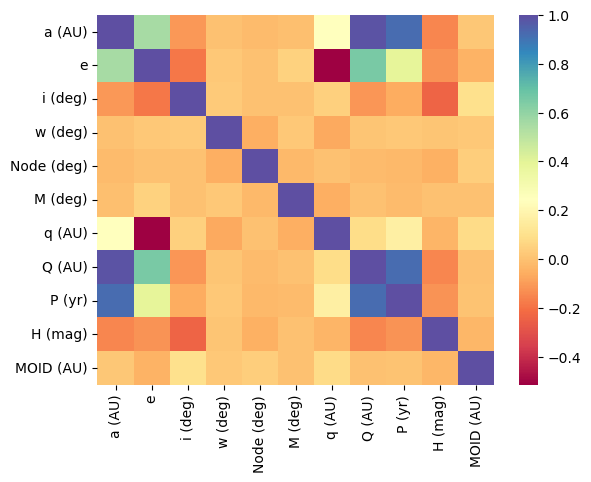

In [47]:
#EDA
sns.heatmap(planet_df.drop('class',axis=1).corr(),cmap="Spectral")

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


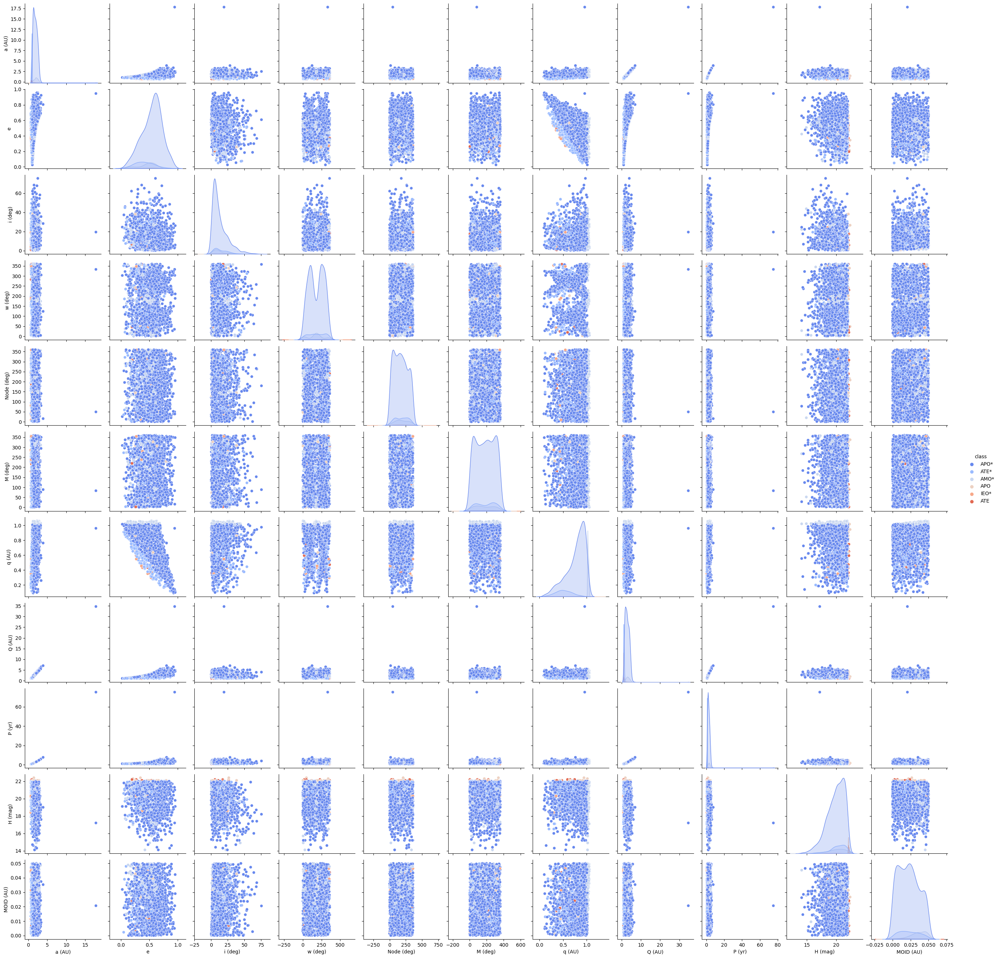

In [48]:
sns.pairplot(planet_df,palette="coolwarm",hue='class')
#most samples are from APO class

<Axes: xlabel='class', ylabel='count'>

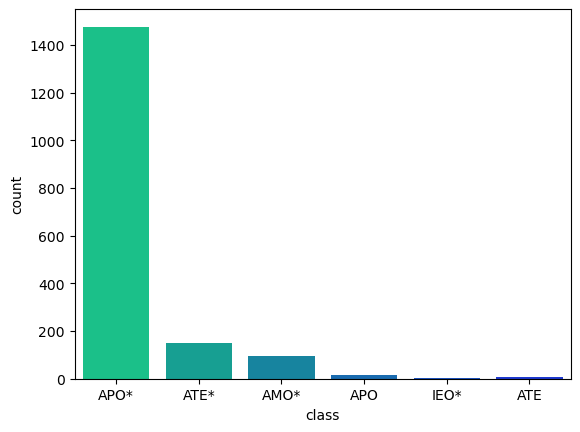

In [49]:
sns.countplot(x='class',data=planet_df,palette="winter_r")
#imbalanced sampling

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


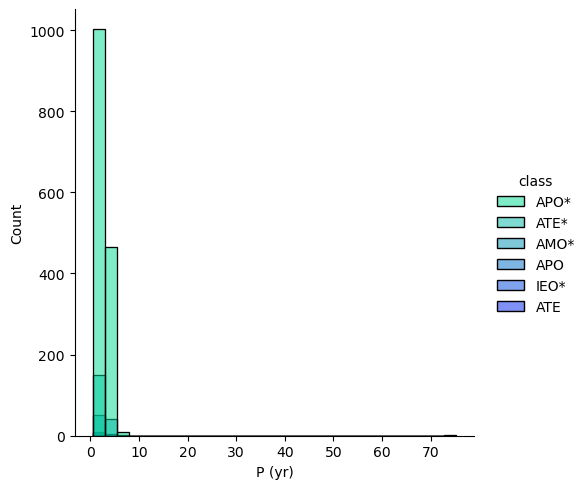

In [50]:
#orbital period P by class
sns.displot(x='P (yr)',data=planet_df,bins=30,hue='class',palette='winter_r')
#all planets have orbit in range 0-10 julian years except a few

In [51]:
#planet with maximum orbit time
planet_df[planet_df['P (yr)'] == planet_df['P (yr)'].max()]

,a (AU),e,i (deg),w (deg),Node (deg),M (deg),q (AU),Q (AU),P (yr),H (mag),MOID (AU),class
654,17.818679,0.946101,19.370544,332.891363,49.304199,83.055105,0.9604,34.68,75.22,17.2,0.020649,APO*


C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


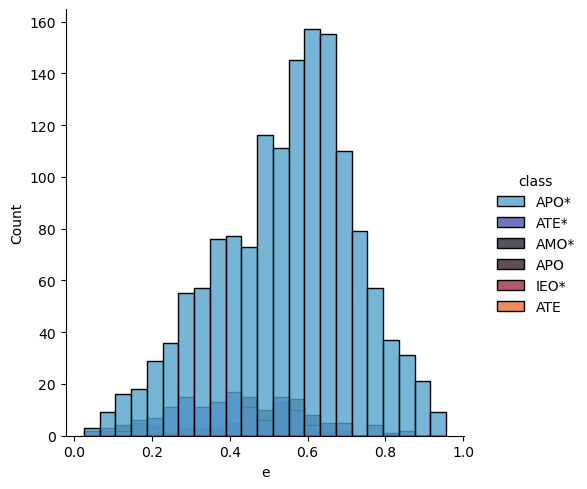

In [53]:
#eccentricity dist
sns.displot(x='e',data=planet_df,hue='class',palette='icefire',alpha=0.8)

In [54]:
#after EDA its time to split data as there are no missing values
from sklearn.model_selection import train_test_split
X = planet_df.drop('class',axis=1)
y = planet_df['class']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)

In [55]:
"""
Classification Models
1.Decision Tree
2.RFC
3.SVM
4.KNN
5.Logistic regression
"""

'\nClassification Models\n1.Decision Tree\n2.RFC\n3.SVM\n4.KNN\n5.Logistic regression\n'

In [56]:
from sklearn.metrics import classification_report,confusion_matrix

In [57]:
#model 1 dtree
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)

In [58]:
print(classification_report(y_test,pred_dtree))
print("\n")
print(confusion_matrix(y_test,pred_dtree))

              precision    recall  f1-score   support

        AMO*       0.96      1.00      0.98        24
         APO       1.00      1.00      1.00         6
        APO*       1.00      1.00      1.00       442
         ATE       1.00      1.00      1.00         3
        ATE*       1.00      1.00      1.00        48
        IEO*       1.00      1.00      1.00         2

    accuracy                           1.00       525
   macro avg       0.99      1.00      1.00       525
weighted avg       1.00      1.00      1.00       525



[[ 24   0   0   0   0   0]
 [  0   6   0   0   0   0]
 [  1   0 441   0   0   0]
 [  0   0   0   3   0   0]
 [  0   0   0   0  48   0]
 [  0   0   0   0   0   2]]


In [59]:
#model 2 RFc
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier();
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)

In [60]:
print(classification_report(y_test,pred_rfc))
print("\n")
print(confusion_matrix(y_test,pred_rfc))

              precision    recall  f1-score   support

        AMO*       0.96      1.00      0.98        24
         APO       1.00      1.00      1.00         6
        APO*       1.00      1.00      1.00       442
         ATE       1.00      0.33      0.50         3
        ATE*       0.94      1.00      0.97        48
        IEO*       1.00      0.50      0.67         2

    accuracy                           0.99       525
   macro avg       0.98      0.81      0.85       525
weighted avg       0.99      0.99      0.99       525



[[ 24   0   0   0   0   0]
 [  0   6   0   0   0   0]
 [  1   0 441   0   0   0]
 [  0   0   0   1   2   0]
 [  0   0   0   0  48   0]
 [  0   0   0   0   1   1]]


In [61]:
#model 3 knn
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train,y_train)
pred_knn = knn.predict(X_test)

In [62]:
print(classification_report(y_test,pred_knn))
print("\n")
print(confusion_matrix(y_test,pred_knn))

              precision    recall  f1-score   support

        AMO*       0.40      0.08      0.14        24
         APO       0.00      0.00      0.00         6
        APO*       0.84      0.99      0.91       442
         ATE       0.00      0.00      0.00         3
        ATE*       0.00      0.00      0.00        48
        IEO*       0.00      0.00      0.00         2

    accuracy                           0.84       525
   macro avg       0.21      0.18      0.18       525
weighted avg       0.73      0.84      0.77       525



[[  2   0  22   0   0   0]
 [  0   0   6   0   0   0]
 [  3   0 439   0   0   0]
 [  0   0   3   0   0   0]
 [  0   0  48   0   0   0]
 [  0   0   2   0   0   0]]


C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [66]:
err_rate = []
for i in range(1,50):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_for = knn.predict(X_test)
    err_rate.append(np.mean(y_test!=pred_for))
    

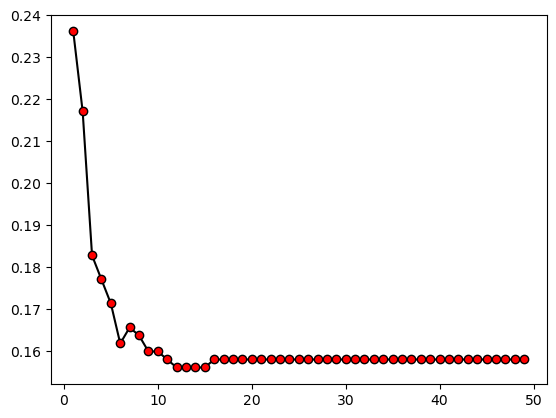

In [67]:
#plotting k values
plt.plot(range(1,50),err_rate,color="black",linestyle="-",marker="o",markerfacecolor="red")

In [69]:
#k=14 gives lowest error
knn_final = KNeighborsClassifier(n_neighbors=14)
knn_final.fit(X_train,y_train)
pred_knn_final = knn_final.predict(X_test)

In [70]:
print(classification_report(y_test,pred_knn_final))
print("\n")
print(confusion_matrix(y_test,pred_knn_final))

              precision    recall  f1-score   support

        AMO*       1.00      0.04      0.08        24
         APO       0.00      0.00      0.00         6
        APO*       0.84      1.00      0.92       442
         ATE       0.00      0.00      0.00         3
        ATE*       0.00      0.00      0.00        48
        IEO*       0.00      0.00      0.00         2

    accuracy                           0.84       525
   macro avg       0.31      0.17      0.17       525
weighted avg       0.76      0.84      0.77       525



[[  1   0  23   0   0   0]
 [  0   0   6   0   0   0]
 [  0   0 442   0   0   0]
 [  0   0   3   0   0   0]
 [  0   0  48   0   0   0]
 [  0   0   2   0   0   0]]


C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [71]:
#model 4 SVM
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_train,y_train)
pred_svm = svm.predict(X_test)

In [72]:
print(classification_report(y_test,pred_svm))
print("\n")
print(confusion_matrix(y_test,pred_svm))

              precision    recall  f1-score   support

        AMO*       0.00      0.00      0.00        24
         APO       0.00      0.00      0.00         6
        APO*       0.84      1.00      0.91       442
         ATE       0.00      0.00      0.00         3
        ATE*       0.00      0.00      0.00        48
        IEO*       0.00      0.00      0.00         2

    accuracy                           0.84       525
   macro avg       0.14      0.17      0.15       525
weighted avg       0.71      0.84      0.77       525



[[  0   0  24   0   0   0]
 [  0   0   6   0   0   0]
 [  0   0 442   0   0   0]
 [  0   0   3   0   0   0]
 [  0   0  48   0   0   0]
 [  0   0   2   0   0   0]]


C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
"""
Best Performing Models - 1.Dtree 2.RFC
"""